In [240]:

from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
import datetime as dt

import time
import json
import requests
import subprocess
import glob
import os

data_path = './data'

MMPOSE_IP = '10.1.1.142'
MMPOSE_PORT = 3129


## 📸 Capture Images

In [187]:
# extract images from Blender
# Paths (update these to match your system)
blender_path = '/Applications/Blender.app/Contents/MacOS/Blender'  # Path to Blender executable
blend_file = '/Users/holu/Documents/tinkering/PoseDetection/simulator/simulator.blend'                           # Path to your Blender file
script_path = '/Users/holu/Documents/tinkering/PoseDetection/simulator/capture_camera_view.py'                   # Path to the script we just created

# Command to run
command = [
    blender_path,
    blend_file,
    '--python', script_path     # Execute the Python script
]

# Execute the command
subprocess.run(command)


Read prefs: /Users/holu/Library/Application Support/Blender/3.4/config/userpref.blend
Reloading external rigs...
Reloading external metarigs...


CAD_Sketcher-main:{INFO}: Logging into: /var/folders/3c/t08nl7456zl9jcq07p2xt7x80000gn/T/CAD_Sketcher-main.log


blenderkit addon: Verbose is enabled
blenderkit addon: Read in JSON settings from file
Read blend: /Users/holu/Documents/tinkering/PoseDetection/simulator/simulator.blend
Saved: '/Users/holu/Documents/tinkering/PoseDetection/simulator/data/20240930112036/Camera.000.png'
OpenGL Render written to '/Users/holu/Documents/tinkering/PoseDetection/simulator/data/20240930112036/Camera.000.png'
Saved: '/Users/holu/Documents/tinkering/PoseDetection/simulator/data/20240930112036/Camera.001.png'
OpenGL Render written to '/Users/holu/Documents/tinkering/PoseDetection/simulator/data/20240930112036/Camera.001.png'
Saved: '/Users/holu/Documents/tinkering/PoseDetection/simulator/data/20240930112036/Camera.002.png'
OpenGL Render written to '/Users/holu/Documents/tinkering/PoseDetection/simulator/data/20240930112036/Camera.002.png'
Saved: '/Users/holu/Documents/tinkering/PoseDetection/simulator/data/20240930112036/Camera.003.png'
OpenGL Render written to '/Users/holu/Documents/tinkering/PoseDetection/sim

CompletedProcess(args=['/Applications/Blender.app/Contents/MacOS/Blender', '/Users/holu/Documents/tinkering/PoseDetection/simulator/simulator.blend', '--python', '/Users/holu/Documents/tinkering/PoseDetection/simulator/capture_camera_view.py'], returncode=0)

In [406]:
# 🔋 load images

# Get the list of subfolders in the data folder
subfolders = [f.path for f in os.scandir(data_path) if f.is_dir()]

# Get the list of image files in each subfolder
image_files = []
for folder in subfolders:
    image_files.extend(glob.glob(folder + '/*.png'))

# Sort the image files based on their creation time
image_files.sort(key=os.path.getctime)

# Get the last four image files
last_captures = image_files[-4:]

# Load the last captures as image variables
image1 = Image.open(last_captures[0])
image2 = Image.open(last_captures[1])
image3 = Image.open(last_captures[2])
image4 = Image.open(last_captures[3])

# # Create a 2x2 grid of subplots
# fig, axs = plt.subplots(2, 2)
# fig.set_size_inches(10, 8)

# # Plot the images in the subplots
# axs[0, 0].imshow(image1)
# axs[0, 0].set_title('Image 1')
# axs[0, 1].imshow(image2)
# axs[0, 1].set_title('Image 2')
# axs[1, 0].imshow(image3)
# axs[1, 0].set_title('Image 3')
# axs[1, 1].imshow(image4)
# axs[1, 1].set_title('Image 4')

# # Remove the axis labels
# for ax in axs.flat:
#     ax.set(xticks=[], yticks=[])
#     ax.margins(0.05)

# # Display the grid of images
# plt.show()

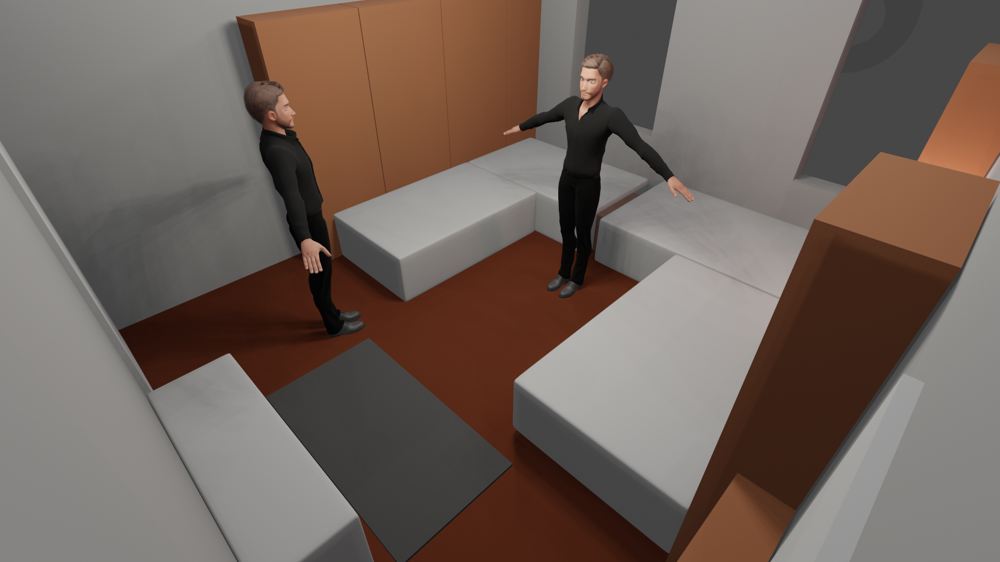

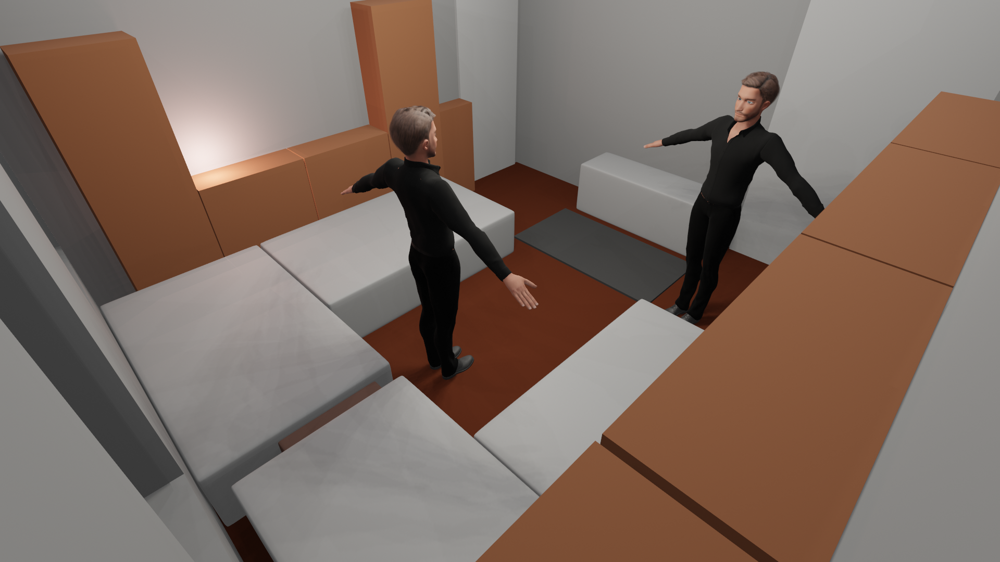

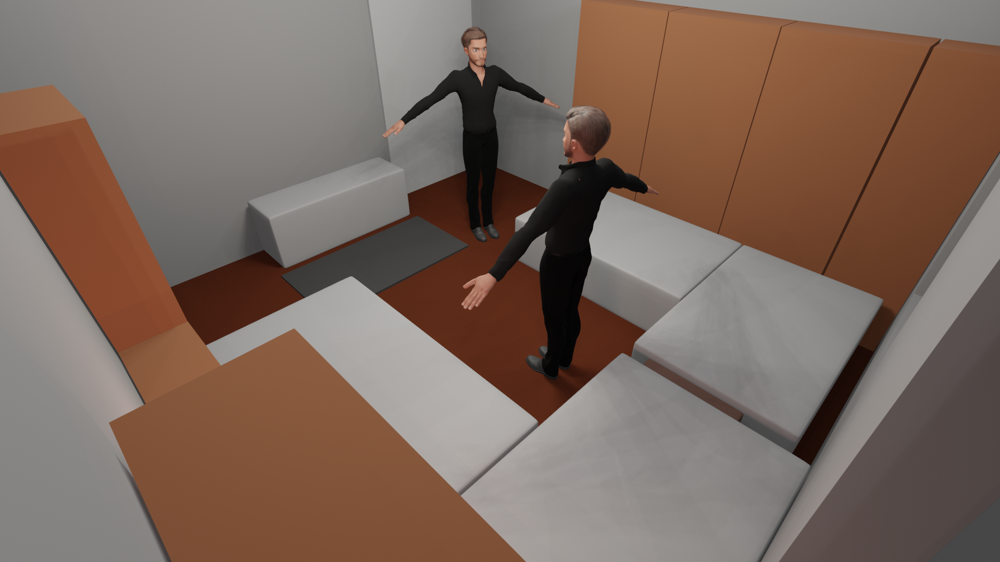

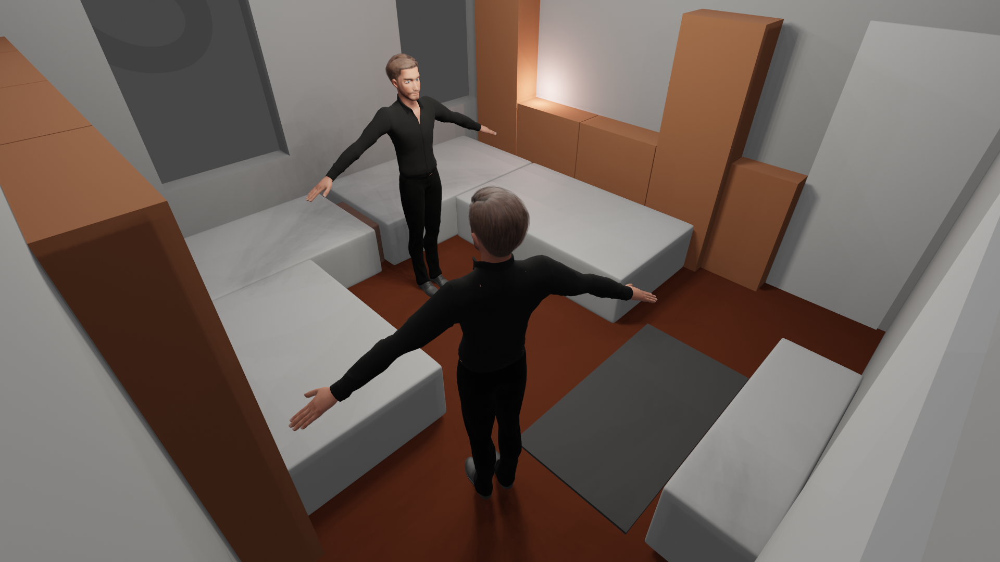

In [408]:
# 🌁display and buffer current images for further processing
images = [image1, image2, image3, image4]
for image in images:
    display(image)

## Pose Detection

In [134]:
import mediapipe as mp
import cv2
import numpy as np

mp_pose = mp.solutions.pose
mp_drawing = mp.solutions.drawing_utils

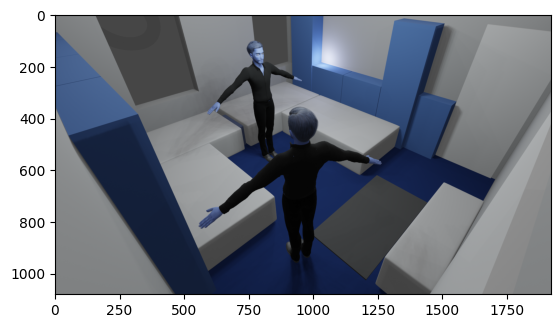

In [211]:
# experiment = '20240924140604'
experiment = '20240924161537'
experiment = '20240924161930' # single person detection
experiment = '20240926132814' # multi-person detection
selected_camera = 'Camera.003'
test_image_path = glob.glob(data_path + f'/{experiment}/{selected_camera}.png')[0]
test_image = cv2.imread(test_image_path)
plt.imshow(test_image)

In [411]:
# build test images
test_case_type = 'multi_person'
test_case_type = 'single_person'

if test_case_type == 'single_person':
    experiment = '20240924140604'
elif test_case_type == 'multi_person':
    experiment = '20240926132814'
else:
    raise ValueError('Invalid test case type')

test_images = []
# get all images in the experiment folder and load them as PIL image
experiment_images = glob.glob(data_path + f'/{experiment}/*.png')
for image_path in experiment_images:
    test_image = Image.open(image_path)
    test_images.append(test_image)
    

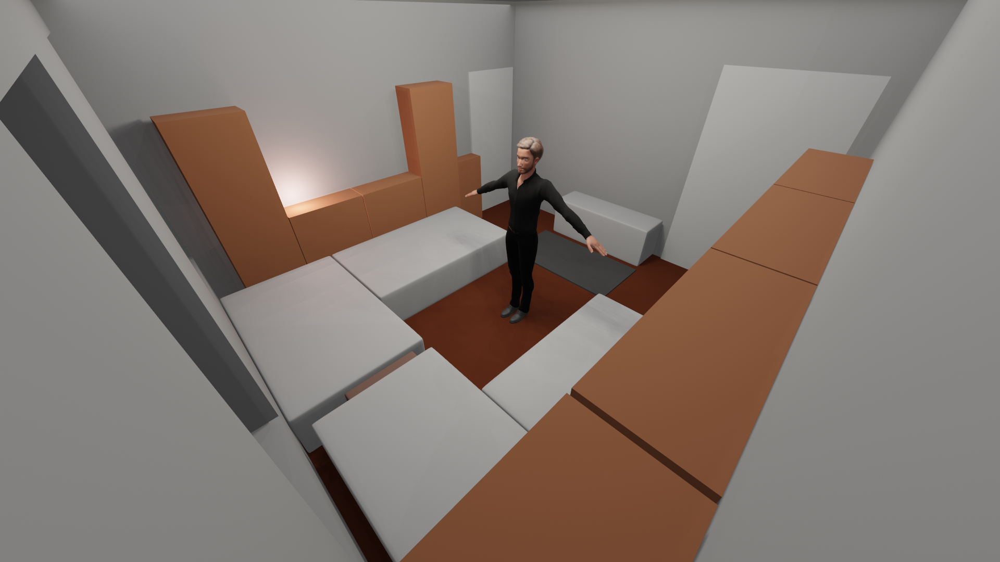

In [412]:
test_images[0]

### Mediapipe


I0000 00:00:1727350959.260562 6704704 gl_context.cc:357] GL version: 2.1 (2.1 Metal - 88), renderer: Apple M1
W0000 00:00:1727350959.338925 7359004 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1727350959.366349 7359004 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


#PoseDetections: 1


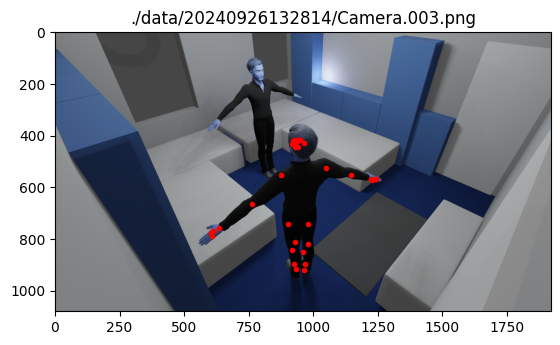

In [170]:
# https://github.com/google-ai-edge/mediapipe-samples/blob/main/examples/pose_landmarker/python/%5BMediaPipe_Python_Tasks%5D_Pose_Landmarker.ipynb
# STEP 1: Import the necessary modules.
import mediapipe as mp
from mediapipe.tasks import python
from mediapipe.tasks.python import vision

# STEP 2: Create an PoseLandmarker object.
base_options = python.BaseOptions(model_asset_path='pose_landmarker.task')
options = vision.PoseLandmarkerOptions(
    base_options=base_options,
    num_poses=4,
    min_pose_detection_confidence=0.2, #[0, 1]
    min_pose_presence_confidence=0.2, #[0, 1]
    min_tracking_confidence=0.2, #[0, 1]
    # result_callback=print_result
    output_segmentation_masks=True,
)
detector = vision.PoseLandmarker.create_from_options(options)

# STEP 3: Load the input image.
image = mp.Image.create_from_file(test_image_path)

# STEP 4: Detect pose landmarks from the input image.
detection_result = detector.detect(image)
print("#PoseDetections:", len(detection_result.pose_landmarks))

# show the test_image with the landmarks
x,y,_ = test_image.shape
fig = plt.figure()
ax = fig.add_subplot(111)
ax.title.set_text(test_image_path)
ax.imshow(test_image)
colors = ['r', 'g', 'b', 'y']
for i, pose_landmarks in enumerate(detection_result.pose_landmarks):
    for landmark in pose_landmarks:
        ax.plot(landmark.x * y, landmark.y * x, colors[i % len(colors)] + '.')
plt.show()



In [152]:
len(detection_result.pose_landmarks)

2

### mmPose - self hosted on homeBase

#### Upload Images

In [413]:
# upload test_case to server
# input:
    # list(image_data)
# return:
    # list[
    #   PoseLandmarks(
    #       list(float)
    #   )
    # )]

# send images to server
# extract keypoints for poses on return
def upload_images_to_server(images: list):
    assert images is not None, "There are no images to process"
    assert len(images) > 0, "There are no images to process"
    for image in images:
        assert isinstance(image, Image.Image), "Each image in the 'images' list must be of type PIL image"

    import requests
    from io import BytesIO

    url = f'http://{MMPOSE_IP}:{MMPOSE_PORT}/upload'  # Update the URL if running on a different host or port

    files = []

    for idx, img in enumerate(images):
        img_io = BytesIO()
        img.save(img_io, format='PNG')
        img_io.seek(0)
        # The filename doesn't affect the saved name on the server, but we'll use it anyway
        files.append(('images', (f'Camera.{idx:03d}.png', img_io, 'image/png')))

    response = requests.post(url, files=files)

    if response.status_code == 200:
        print(f'[INFO] ImageUpload@{MMPOSE_IP}:{MMPOSE_PORT}')
        global last_upload
        last_upload = dt.datetime.now()
        print(f'[INFO] last upload at {last_upload}')
    else:
        print('Error:', response.text)
    return response


images = test_images
upload_response = upload_images_to_server(images)
print('ResponseCode:', upload_response.status_code)
print(json.dumps(upload_response.json(), indent=2))


[INFO] ImageUpload@10.1.1.142:3129
[INFO] last upload at 2024-10-02 11:31:47.032990
ResponseCode: 200
{
  "info": {
    "last_access": "2024-10-02T11:31:47.055007",
    "state": "new",
    "upload_time": "2024-10-02T11:31:47.055007",
    "uuid": "26ca9f85-b107-42e3-bd8f-a6dcea6842ff"
  },
  "paths": [
    "uploads\\Camera.000.png",
    "uploads\\Camera.001.png",
    "uploads\\Camera.002.png",
    "uploads\\Camera.003.png"
  ]
}


#### Process Uploaded Images

In [414]:
import requests

assert last_upload is not None, "No images have been uploaded to the server yet"

# Define the endpoint URL
url = f"http://{MMPOSE_IP}:{MMPOSE_PORT}/process"

# Define the payload for the POST request
payload = {
    "action": "continue"
}

# Send the POST request
response = requests.post(url, json=payload)
process_response = response

# Check the response status code
if process_response.status_code == 200:
    process_response_json = response.json()
    process_response_info = process_response_json["data"]["upload_state"]
    process_response_data = process_response_json["data"]['results']
    print(json.dumps(process_response_info, indent=2))
    for res, valiues in process_response_data.items():
        print(res)
        print(json.dumps(json.loads(valiues), indent=2))
else:
    print("Failed to send action")
    print(response)

{
  "last_access": "2024-10-02T11:31:53.372876",
  "state": "finished",
  "upload_time": "2024-10-02T11:31:47.055007",
  "uuid": "26ca9f85-b107-42e3-bd8f-a6dcea6842ff"
}
Camera.000.png
[
  {
    "keypoints": [
      [
        999.5902709960938,
        312.50244140625
      ],
      [
        1010.2265625,
        306.2979431152344
      ],
      [
        996.0448608398438,
        302.75250244140625
      ],
      [
        1030.61279296875,
        308.9570007324219
      ],
      [
        993.3858032226562,
        301.86614990234375
      ],
      [
        1043.908203125,
        355.9339904785156
      ],
      [
        981.8630981445312,
        339.9795227050781
      ],
      [
        1086.453369140625,
        406.4563903808594
      ],
      [
        949.06787109375,
        355.047607421875
      ],
      [
        1128.1121826171875,
        450.7742919921875
      ],
      [
        917.1589965820312,
        367.4566345214844
      ],
      [
        1014.6583862304

In [415]:
print(upload_response.json()['info']['uuid'], "<- upload uuid")
print(process_response_info['uuid'], "<- process uuid")
for res in process_response_data.keys():
    print("\t",res)


26ca9f85-b107-42e3-bd8f-a6dcea6842ff <- upload uuid
26ca9f85-b107-42e3-bd8f-a6dcea6842ff <- process uuid
	 Camera.000.png
	 Camera.001.png
	 Camera.002.png
	 Camera.003.png


In [416]:
# itterate over cameras (keys) and extract keypoint-groups
for camera in process_response_data.keys():
    print(camera)
    data = json.loads(process_response_data[camera])
    for idx, pose in enumerate(data):
        print(f'Pose {idx+1}: head: {pose["keypoints"][0]}')


Camera.000.png
Pose 1: head: [999.5902709960938, 312.50244140625]
Camera.001.png
Pose 1: head: [977.3422241210938, 301.02044677734375]
Camera.002.png
Pose 1: head: [952.5667724609375, 302.6322021484375]
Camera.003.png
Pose 1: head: [913.583251953125, 314.011962890625]


## save experiment data

In [417]:
experiments_path = './experiments'
os.makedirs(experiments_path, exist_ok=True)

def save_experiment_data(experiment_name, images, detection_data):
    experiment_slak = experiment_name.replace(':', '_').replace(' ', '_')
    experiment_path = f'{experiments_path}/{experiment_slak}'
    os.makedirs(experiment_path, exist_ok=False)
    for idx, image in enumerate(images):
        image.save(f'{experiment_path}/Camera.{idx:03d}.png')
    with open(f'{experiment_path}/detection_data.json', 'w') as f:
        json.dump(detection_data, f, indent=2)

In [420]:
process_response_data_cleaned = {}
for k, v in process_response_data.items():
    print(k)
    print(json.loads(v))
    process_response_data_cleaned[k] = json.loads(v)[0]

Camera.000.png
[{'keypoints': [[999.5902709960938, 312.50244140625], [1010.2265625, 306.2979431152344], [996.0448608398438, 302.75250244140625], [1030.61279296875, 308.9570007324219], [993.3858032226562, 301.86614990234375], [1043.908203125, 355.9339904785156], [981.8630981445312, 339.9795227050781], [1086.453369140625, 406.4563903808594], [949.06787109375, 355.047607421875], [1128.1121826171875, 450.7742919921875], [917.1589965820312, 367.4566345214844], [1014.6583862304688, 456.9787902832031], [983.6358642578125, 451.66064453125], [1010.2265625, 531.432861328125], [988.9539794921875, 525.2283325195312], [1005.7947998046875, 592.591552734375], [988.9539794921875, 581.9552612304688]], 'keypoint_scores': [1.0381250381469727, 0.9872198700904846, 1.0901768207550049, 1.0397634506225586, 0.817598819732666, 0.77930748462677, 0.8646939396858215, 0.8708517551422119, 0.840108335018158, 0.9075071811676025, 0.9023464918136597, 0.7521636486053467, 0.724282443523407, 0.9335874319076538, 0.899266839

In [421]:
process_response_info

{'last_access': '2024-10-02T11:31:53.372876',
 'state': 'finished',
 'upload_time': '2024-10-02T11:31:47.055007',
 'uuid': '26ca9f85-b107-42e3-bd8f-a6dcea6842ff'}

In [422]:
process_response_data

{'Camera.000.png': '[\n    {\n        "keypoints": [\n            [\n                999.5902709960938,\n                312.50244140625\n            ],\n            [\n                1010.2265625,\n                306.2979431152344\n            ],\n            [\n                996.0448608398438,\n                302.75250244140625\n            ],\n            [\n                1030.61279296875,\n                308.9570007324219\n            ],\n            [\n                993.3858032226562,\n                301.86614990234375\n            ],\n            [\n                1043.908203125,\n                355.9339904785156\n            ],\n            [\n                981.8630981445312,\n                339.9795227050781\n            ],\n            [\n                1086.453369140625,\n                406.4563903808594\n            ],\n            [\n                949.06787109375,\n                355.047607421875\n            ],\n            [\n                1128.1121

In [423]:
experiment_name = "single-person-detection"
process_response_info_extended = process_response_info.copy()
process_response_info_extended['experiment_number'] = experiment
process_response_info_extended['experiment_name'] = experiment_name
process_response_info_extended

{'last_access': '2024-10-02T11:31:53.372876',
 'state': 'finished',
 'upload_time': '2024-10-02T11:31:47.055007',
 'uuid': '26ca9f85-b107-42e3-bd8f-a6dcea6842ff',
 'experiment_number': '20240924140604',
 'experiment_name': 'single-person-detection'}

In [424]:
save_experiment_data(
    experiment_name, 
    test_images, 
    {
        "info": process_response_info_extended,
        "data": process_response_data_cleaned
    })

## Reconstruct the Pose in 3D

In [ ]:
# TODO: get camera positions and rotations from blender file
# TODO: load data from saved experiment

In [ ]:
## STEP 1: Extract Parameters


### Build Camera Model

In [ ]:
import numpy as np

class Camera:
    def __init__(self, name, position: np.array, rotation: np.array, focal_length, sensor_size, resolution):
        self.name = name
        self.position = position
        self.rotation = rotation

        self.intrinsic_parameters = {
            'focal_length': focal_length,  # in mm
            'sensor_size': sensor_size,    # (width_mm, height_mm)
            'resolution': resolution,      # (width_px, height_px)
            'principal_point': (resolution[0] / 2, resolution[1] / 2)
        }

        self.extrinsic_parameters = {
            'translation_vector': position,
            'rotation_matrix': self.compute_rotation_matrix(rotation)
        }

        self.projection_matrix = self.calculate_projection_matrix()

    def compute_rotation_matrix(self, rotation_angles):
        # Convert Euler angles (in degrees) to rotation matrix
        rx, ry, rz = np.radians(rotation_angles)
        Rx = np.array([[1, 0, 0],
                       [0, np.cos(rx), -np.sin(rx)],
                       [0, np.sin(rx), np.cos(rx)]])
        Ry = np.array([[np.cos(ry), 0, np.sin(ry)],
                       [0, 1, 0],
                       [-np.sin(ry), 0, np.cos(ry)]])
        Rz = np.array([[np.cos(rz), -np.sin(rz), 0],
                       [np.sin(rz), np.cos(rz), 0],
                       [0, 0, 1]])
        return Rz @ Ry @ Rx  # Note the order of multiplication

    def calculate_intrinsic_matrix(self):
        f_mm = self.intrinsic_parameters['focal_length']
        sensor_w_mm, sensor_h_mm = self.intrinsic_parameters['sensor_size']
        res_w_px, res_h_px = self.intrinsic_parameters['resolution']
        c_x, c_y = self.intrinsic_parameters['principal_point']

        # Compute scale factors
        s_x = res_w_px / sensor_w_mm
        s_y = res_h_px / sensor_h_mm

        f_x = f_mm * s_x
        f_y = f_mm * s_y

        K = np.array([
            [f_x, 0, c_x],
            [0, f_y, c_y],
            [0, 0, 1]
        ])
        return K

    def calculate_projection_matrix(self):
        K = self.calculate_intrinsic_matrix()
        R = self.extrinsic_parameters['rotation_matrix']
        t = self.extrinsic_parameters['translation_vector'].reshape(3, 1)
        RT = np.hstack((R, t))
        P = K @ RT
        return P


In [ ]:
def backproject_keypoints(self, keypoints: list):
    rays_world = []
    K_inv = np.linalg.inv(self.calculate_intrinsic_matrix())
    R_inv = np.linalg.inv(self.extrinsic_parameters['rotation_matrix'])
    C = self.position  # Camera center in world coordinates

    for kp in keypoints:
        u, v = kp
        # Create homogeneous image coordinate
        uv1 = np.array([u, v, 1])

        # Backproject to normalized camera coordinates
        xyz_camera = K_inv @ uv1

        # Transform to world coordinates
        direction_world = R_inv @ xyz_camera

        # Normalize the direction vector
        direction_world /= np.linalg.norm(direction_world)

        # Form the ray (origin, direction)
        ray = {'origin': C, 'direction': direction_world}
        rays_world.append(ray)
    return rays_world


In [ ]:
camera = Camera(
    name='Camera.000',
    position=np.array([0,0,0]),
    rotation=np.array([0,0,0])
)

## STEP 3: building projection rays

## STEP 4: backprojecting keypoints


## STEP 6: visualizing 3D keypoints



In [ ]:
## STEP 4: triangulating keypoints
def triangulate_points(cameras, keypoints_per_camera):
    """
    cameras: list of Camera objects
    keypoints_per_camera: list of lists, where each sublist contains keypoints for a camera
    """
    num_keypoints = len(keypoints_per_camera[0])
    points_3d = []

    for i in range(num_keypoints):
        A = []
        for cam_idx, cam in enumerate(cameras):
            P = cam.projection_matrix
            u, v = keypoints_per_camera[cam_idx][i]
            # Formulate equations
            X_row = u * P[2, :] - P[0, :]
            Y_row = v * P[2, :] - P[1, :]
            A.append(X_row)
            A.append(Y_row)
        A = np.array(A)
        # Solve for X using SVD
        U, S, Vt = np.linalg.svd(A)
        X = Vt[-1]
        X = X / X[-1]  # Homogeneous to Cartesian coordinates
        points_3d.append(X[:3])
    return points_3d


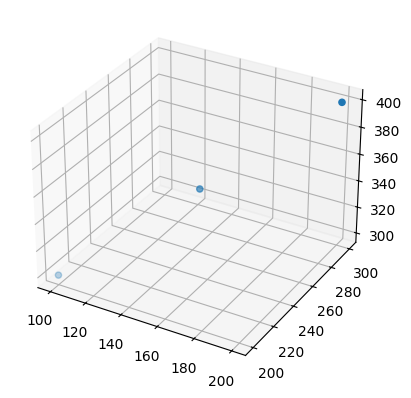

In [426]:
def visualize_keypoints(points_3d):
    # Use Blender's API or a 3D plotting library like matplotlib
    import matplotlib.pyplot as plt
    from mpl_toolkits.mplot3d import Axes3D

    xs, ys, zs = zip(*points_3d)
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    ax.scatter(xs, ys, zs)
    plt.show()


example_points = [
    [100, 200, 300],
    [150, 250, 350],
    [200, 300, 400]
]

visualize_keypoints(example_points)

In [ ]:
# TODO: build rotateable 3D model of the scene with the poses and cameras


In [144]:
# TODO:

In [145]:
# TODO: reconstruct pointed direction [N, E, S, W] most likely direction


In [ ]:
/Users/holu/Documents/tinkering/PoseDetection/simulator/data/20240924140604/Camera.003.png
/Users/holu/Documents/tinkering/PoseDetection/simulator/data/20240924140604/Camera.002.png
/Users/holu/Documents/tinkering/PoseDetection/simulator/data/20240924140604/Camera.001.png
/Users/holu/Documents/tinkering/PoseDetection/simulator/data/20240924140604/Camera.000.png